In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas.io.parsers import read_csv
from sklearn.utils import shuffle

In [2]:
import cv2

In [3]:
#import swifter
import concurrent.futures

In [4]:
FTRAIN = "/images/params.csv"

In [5]:
import tensorflow as tf
from keras.backend.tensorflow_backend import set_session
print(tf.__version__)
#config = tf.ConfigProto()
#config.gpu_options.per_process_gpu_memory_fraction = 0.95
#config.gpu_options.visible_device_list = "0"
#### 1 GPU1
#### 2 GPU2
#### 0 GPU3
#### 4 GPU4
#set_session(tf.Session(config=config))

1.15.0


Using TensorFlow backend.


In [6]:
input_height, input_width = 320, 320 #384, 384

In [7]:
def get_rotate_matrix(scale_limit=(-0.1, 0.1),
                           rotate_limit=(-5, 5), aspect_limit=(-0.1, 0.1)):
    angle = np.random.uniform(rotate_limit[0], rotate_limit[1])  # degree
    scale = np.random.uniform(1 + scale_limit[0], 1 + scale_limit[1])
    aspect = np.random.uniform(1 + aspect_limit[0], 1 + aspect_limit[1])
    sx = scale * aspect / (aspect ** 0.5)
    sy = scale / (aspect ** 0.5)
    
    cc = np.math.cos(angle / 180 * np.math.pi) * sx
    ss = np.math.sin(angle / 180 * np.math.pi) * sy
    return np.array([[cc, -ss], [ss, cc]])


In [8]:
def get_image(fname):
    img = cv2.imread(fname, cv2.IMREAD_ANYDEPTH | cv2.IMREAD_GRAYSCALE)
    #if img is None:
    #     return None
    img = img.astype(np.float32)
    img = cv2.resize(img, (input_width, input_height))
    
    ms = cv2.moments(img)
    rotate = -1 if ms['m10'] > ms['m00'] * (input_width - 1.) / 2 else 1
    ##mirrorY = ms['m01'] > ms['m00'] * (input_height - 1.) / 2
    
    if rotate == -1:
        img = cv2.flip(img, -1)
    
    img = img[np.newaxis, :]
    return img, rotate

In [9]:
def NormalizeData(data):
    return (data - np.min(data)) / float(np.max(data) - np.min(data))

In [10]:
def plot_sample(X,y,axs):
    '''
    kaggle picture is 96 by 96
    y is rescaled to range between -1 and 1
    '''
    
    axs.imshow(X.reshape(input_width,input_height),cmap="gray")
    axs.scatter((input_width//2)*y[0::2]+ (input_width//2),(input_height//2)*y[1::2]+ (input_height//2))
    
def load(ids):
    """
    load test/train data
    cols : a list containing landmark label names.
           If this is specified, only the subset of the landmark labels are 
           extracted. for example, cols could be:
           
          [left_eye_center_x, left_eye_center_y]
            
    return: 
    X: 2-d numpy array (Nsample, Ncol*Nrow)
    y: 2-d numpy array (Nsample, Nlandmarks*2) 
       In total there are 15 landmarks. 
       As x and y coordinates are recorded, u.shape = (Nsample,30)
       
    """

    #fname = FTRAIN
    #df = read_csv(os.path.expanduser(fname)) 
    
    df = ids.copy()
    
    df.reset_index(drop=True, inplace=True)
    
    #df['Image'] = df['Image'].apply(lambda im: np.fromstring(im, sep=' '))
    
    #df[['Image','rotate']] = df['id_string'].apply(lambda im: pd.Series(get_image('/images/all_images/' + im + '.tif')))

    #df[['Image','rotate']] = df['id_string'].swifter.allow_dask_on_strings(enable=True).apply(lambda im: pd.Series(get_image('/images/all_images/' + im + '.tif')))
    
    #with concurrent.futures.ThreadPoolExecutor(max_workers=32) as pool:
    #    df[['Image','rotate']] = pd.DataFrame(pool.map(lambda im: pd.Series(get_image('/images/all_images/' + im + '.tif')), df['id_string'], chunksize=10)) # Without a progressbar

    def ImageFun(im, shift_limit=(-0.0625, 0.0625), borderMode=cv2.BORDER_REFLECT_101):
        #image, rotate = get_image('/images/all_images/' + im + '.tif')
        fname = '/images/all_images/' + im + '.tif'
        img = cv2.imread(fname, cv2.IMREAD_ANYDEPTH | cv2.IMREAD_GRAYSCALE)
        img = img.astype(np.float32)
        #img = cv2.resize(img, (input_width, input_height))

        height, width = img.shape[:2]
        
        ms = cv2.moments(img)
        rotate = -1 if ms['m10'] > ms['m00'] * (width - 1.) / 2 else 1
        ##mirrorY = ms['m01'] > ms['m00'] * (input_height - 1.) / 2
        
        rotate_matrix = get_rotate_matrix()
        
        dx = round(np.random.uniform(shift_limit[0], shift_limit[1]))
        dy = round(np.random.uniform(shift_limit[0], shift_limit[1]))
        box1 = np.array([[0, 0], [input_width, 0], [input_width, input_height], [0, input_height], ])
        box1 = box1 - np.array([input_width / 2, input_height / 2])
        box1 = np.dot(box1, rotate_matrix.T) + np.array([input_width * (0.5 + dx), input_height * (0.5 + dy)])

        box0 = np.array([[0, 0], [width, 0], [width, height], [0, height], ])
        
        box0 = box0.astype(np.float32)
        box1 = box1.astype(np.float32)
        mat = cv2.getPerspectiveTransform(box0, box1)
        img = cv2.warpPerspective(img, mat, (input_width, input_height), flags=cv2.INTER_CUBIC, borderMode=borderMode, borderValue=(0))

        if rotate == -1:
            img = cv2.flip(img, -1)
        
        img = img[np.newaxis, :]
    
        return img, rotate, rotate_matrix, dx, dy
    
    with concurrent.futures.ThreadPoolExecutor(max_workers=32) as pool:
        df[['Image','rotate', 'rotate_matrix', 'dx', 'dy']] = pd.DataFrame(list(pool.map(ImageFun, df['id_string'], chunksize=10))) # Without a progressbar

    
        
    '''
    with concurrent.futures.ThreadPoolExecutor(max_workers=8) as pool:
        #fut = pool.map(ImageFun, df['id_string'], chunksize=10) # Without a progressbar
        fut = {pool.submit(ImageFun, data):data for data in df['id_string']}
        #res = list([(list(x.result() for x in concurrent.futures.as_completed(fut)))])
        res = pd.DataFrame(x.result() for x in concurrent.futures.as_completed(fut))
        #print('res')
        #print(res)
        df[['Image','rotate', 'rotate_matrix', 'dx', 'dy']] = res
    '''     
        
    #df[['Image','rotate', 'rotate_matrix', 'dx', 'dy']] = df['id_string'].apply(lambda im: pd.Series(ImageFun(im)))
    
    del df['id_string']

    #if cols:  
    #    df = df[list(cols) + ['Image']]

    #myprint = df.count()
    #myprint = myprint.reset_index()
    #print(myprint)  
    
    ## row with at least one NA columns are removed!
    df = df.dropna()  

    '''

    #X = np.vstack(df['Image'].values) / 255.  # changes valeus between 0 and 1
    #X = np.vstack(df['Image'].values) / 65535.  # changes valeus between 0 and 1
    X = NormalizeData(np.vstack(df['Image'].values))
    X = X.astype(np.float32)

    print(df['rotate'])
    
    ## standardization of the response
    y = df[df.columns[:-2]]#.values
    #y = (y - 48) / 48  # y values are between [-1,1]
    y = (y - 0.5) * 2
    y = y.mul(df['rotate'], axis='rows')
    y = y.values
    X, y = shuffle(X, y, random_state=42)  # shuffle data
    y = y.astype(np.float32)
    
    #del df['rotate']
    
    return X, y
    
    '''

    all_x = []
    all_y = []
    for index, row in df.iterrows():
        X = NormalizeData(row['Image'])
        X = X.astype(np.float32)
        all_x.append([X])
        
        y = row[:-5]
        
        box1 = np.array([[0, 0], [1, 0], [1, 1], [0, 1], ])
        box1 = box1 - np.array([0.5, 0.5])
        box1 = np.dot(box1, row['rotate_matrix'].T) + np.array([0.5 + row['dx'], 0.5 + row['dy']])

        box0 = np.array([[0, 0], [1, 0], [1, 1], [0, 1], ])
        
        box0 = box0.astype(np.float32)
        box1 = box1.astype(np.float32)
        mat = cv2.getPerspectiveTransform(box0, box1)

        y = y.astype(np.float32)

        y = cv2.perspectiveTransform(np.array(y).reshape(-1, 1, 2), mat)
        
        y = y.reshape(-1, 124)
        #y = y[np.newaxis, :]
        
        #y = np.array(list(y[0][0])) 
        
        y = (y - 0.5) * 2
        #y = y.mul(row['rotate'], axis='rows')
        y = y * row['rotate']
        #y = y.values
        
        #y = y.reshape(-1, 1)
        
        # return back to 0..1
        y = (y * 0.5) + 0.5
        
        y = y.astype(np.float32)
        all_y.append(y)

    
    all_x = np.concatenate(all_x)
    all_y = np.concatenate(all_y)
    
    all_x, all_y = shuffle(all_x, all_y, random_state=42)  # shuffle data
    
    return all_x, all_y
        

def load2d(ids):

    re = load(ids)
    
    X = re[0].reshape(-1,input_width,input_height,1)
    y = re[1]

    return X, y

def plot_loss(hist,name,plt,RMSE_TF=False):
    '''
    RMSE_TF: if True, then RMSE is plotted with original scale 
    '''
    loss = hist['loss']
    val_loss = hist['val_loss']
    if RMSE_TF:
        loss = np.sqrt(np.array(loss))*(input_height//2) 
        val_loss = np.sqrt(np.array(val_loss))*(input_height//2) 
        
    plt.plot(loss,"--",linewidth=3,label="train:"+name)
    plt.plot(val_loss,linewidth=3,label="val:"+name)

In [11]:
## load data
#X, y = load2d()
#X.shape
#y.shape

from sklearn import model_selection

img_ids = read_csv(os.path.expanduser(FTRAIN)) 
train_ids, validation_ids = model_selection.train_test_split(img_ids, random_state=42, test_size=0.20)
 

In [12]:
def gaussian_k(x0,y0,sigma, width, height):
        """ Make a square gaussian kernel centered at (x0, y0) with sigma as SD.
        """
        x = np.arange(0, width, 1, float) ## (width,)
        y = np.arange(0, height, 1, float)[:, np.newaxis] ## (height,1)
        return np.exp(-((x-x0)**2 + (y-y0)**2) / (2*sigma**2))



In [13]:
def flatten_except_1dim(weight,ndim=2):
    '''
    change the dimension from:
    (a,b,c,d,..) to (a, b*c*d*..) if ndim = 2
    (a,b,c,d,..) to (a, b*c*d*..,1) if ndim = 3
    '''
    n = weight.shape[0]
    if ndim == 2:
        shape = (n,-1)
    elif ndim == 3:
        shape = (n,-1,1)
    else:
        print("Not implemented!")
    weight = weight.reshape(*shape)
    return(weight)

In [14]:
def generator(ids, batch_size):

  X_data, y_data = load2d(ids)    
  samples_per_epoch = X_data.shape[0]
  number_of_batches = samples_per_epoch/batch_size
  counter=0
  s = 10

  while 1:

    X_batch = np.array(X_data[batch_size*counter:batch_size*(counter+1)]).astype('float32')
    y_batch = np.array(y_data[batch_size*counter:batch_size*(counter+1)]).astype('float32')
    
    y = []
    for row in y_batch:
        Nlandmarks = len(row) // 2
        hm = np.zeros((input_height, input_width, Nlandmarks), dtype = np.float32)
        for i in range(Nlandmarks):
            hm[:,:,i] = gaussian_k(int(row[i*2]*input_width),int(row[i*2+1]*input_height),s,input_width,input_height)
        y.append(hm)
    
    #y, y0, nm_landmark = get_y_as_heatmap(y_batch,height,width, sigma)
    y=np.array(y)
    counter += 1
    yield X_batch,flatten_except_1dim(y,ndim=3)

    #restart counter to yeild data in the next epoch as well
    if counter >= number_of_batches:
        counter = 0
        X_data, y_data = load2d(ids)    
        samples_per_epoch = X_data.shape[0]
        number_of_batches = samples_per_epoch/batch_size
        

In [15]:
BATCH_SIZE = 2

train_generator = generator(train_ids, BATCH_SIZE)
valid_generator = generator(validation_ids, BATCH_SIZE)

In [16]:
from keras.models import *
from keras.layers import *

## output shape is the same as input
output_height, output_width = input_height, input_width 
n = 32*5
nClasses = 62
#nfmp_block1 = 64
#nfmp_block2 = 128

nfmp_block1 = 32
nfmp_block2 = 64


IMAGE_ORDERING =  "channels_last" 
img_input = Input(shape=(input_height,input_width, 1)) 

# Encoder Block 1
x = Conv2D(nfmp_block1, (3, 3), activation='relu', padding='same', name='block1_conv1', data_format=IMAGE_ORDERING )(img_input)
x = Conv2D(nfmp_block1, (3, 3), activation='relu', padding='same', name='block1_conv2', data_format=IMAGE_ORDERING )(x)
block1 = MaxPooling2D((2, 2), strides=(2, 2), name='block1_pool', data_format=IMAGE_ORDERING )(x)
    
# Encoder Block 2
x = Conv2D(nfmp_block2, (3, 3), activation='relu', padding='same', name='block2_conv1', data_format=IMAGE_ORDERING )(block1)
x = Conv2D(nfmp_block2, (3, 3), activation='relu', padding='same', name='block2_conv2', data_format=IMAGE_ORDERING )(x)
x = MaxPooling2D((2, 2), strides=(2, 2), name='block2_pool', data_format=IMAGE_ORDERING )(x)
    
## bottoleneck    
o = (Conv2D(n, (input_height//4, input_width//4), 
            activation='relu' , padding='same', name="bottleneck_1", data_format=IMAGE_ORDERING))(x)
o = (Conv2D(n , ( 1 , 1 ) , activation='relu' , padding='same', name="bottleneck_2", data_format=IMAGE_ORDERING))(o)


## upsamping to bring the feature map size to be the same as the one from block1
## o_block1 = Conv2DTranspose(nfmp_block1, kernel_size=(2,2),  strides=(2,2), use_bias=False, name='upsample_1', data_format=IMAGE_ORDERING )(o)
## o = Add()([o_block1,block1])
## output   = Conv2DTranspose(nClasses,    kernel_size=(2,2),  strides=(2,2), use_bias=False, name='upsample_2', data_format=IMAGE_ORDERING )(o)

## Decoder Block
## upsampling to bring the feature map size to be the same as the input image i.e., heatmap size
output   = Conv2DTranspose(nClasses,    kernel_size=(4,4),  strides=(4,4), use_bias=False, name='upsample_2', data_format=IMAGE_ORDERING )(o)

## Reshaping is necessary to use sample_weight_mode="temporal" which assumes 3 dimensional output shape
## See below for the discussion of weights
output = Reshape((output_width*input_height*nClasses,1))(output)
model = Model(img_input, output)
model.summary()

model.compile(loss='mse',optimizer="rmsprop",sample_weight_mode="temporal")

Instructions for updating:
If using Keras pass *_constraint arguments to layers.

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 320, 320, 1)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 320, 320, 32)      320       
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 320, 320, 32)      9248      
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 160, 160, 32)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 160, 160, 64)      18496     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
___________________________________________

In [ ]:
VALIDATION_STEPS = 20 #int(len(validation_ids) / BATCH_SIZE)

hist = model.fit(train_generator, validation_data=valid_generator, validation_steps=VALIDATION_STEPS,
                     steps_per_epoch = 101, epochs = 50,verbose=True)


Epoch 1/50
101/101 [==============================] - 859s 9s/step - loss: 0.0026 - val_loss: 0.0021
Epoch 2/50
101/101 [==============================] - 808s 8s/step - loss: 0.0015 - val_loss: 0.0013
Epoch 3/50
101/101 [==============================] - 806s 8s/step - loss: 0.0010 - val_loss: 0.0014
Epoch 4/50
101/101 [==============================] - 810s 8s/step - loss: 8.5028e-04 - val_loss: 0.0011
Epoch 5/50
101/101 [==============================] - 806s 8s/step - loss: 7.4151e-04 - val_loss: 6.0242e-04
Epoch 6/50
101/101 [==============================] - 815s 8s/step - loss: 6.6681e-04 - val_loss: 2.6608e-04
Epoch 7/50
101/101 [==============================] - 808s 8s/step - loss: 6.3115e-04 - val_loss: 4.6891e-04
Epoch 8/50
101/101 [==============================] - 803s 8s/step - loss: 6.0637e-04 - val_loss: 3.2364e-04
Epoch 9/50
101/101 [==============================] - 810s 8s/step - loss: 5.6552e-04 - val_loss: 5.8863e-04
Epoch 10/50
101/101 [=========================

In [18]:
model.save('LM21_model')

In [19]:
df = read_csv(os.path.expanduser("/images/bads.lst"), header=None)

In [20]:
df

,0
0,20201218103659489_SNG1218103619_6
1,20201218103848471_SNG1218103632_6
2,20201218105035861_SNG1218103921_6
3,20201218105037050_SNG1218103907_9
4,20201218105210845_SNG1218104028_6
5,20201218113453354_SNG1218113419_6
6,20201218182322747_SNG1218174118_6
7,20201218182326828_SNG1218174118_9
8,20201218182430908_SNG1218174118_6
9,20201218182458236_SNG1218174118_6


In [21]:
df[0] = df[0].apply(lambda im: get_image('/images/all_images/' + im + '.tif')[0])

In [22]:
X_test = NormalizeData(np.vstack(df[0].values))
X_test = X_test.astype(np.float32)
X_test = X_test.reshape(-1,input_width,input_height,1)

In [23]:
y_test = []
for row in X_test:
    y_arr = []
    y_arr.append(row)
    y_arr = np.array(y_arr)
    y_row = model.predict(y_arr)
    y_test.append(y_row)

In [24]:
y_test = np.array(y_test)
y_test = y_test.reshape(-1,output_height,output_width,nClasses)

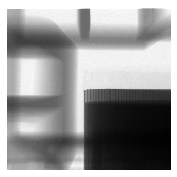

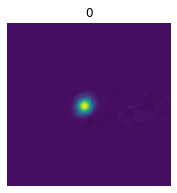

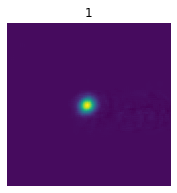

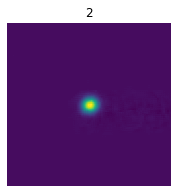

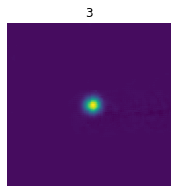

...

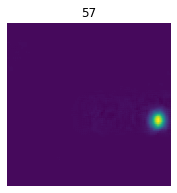

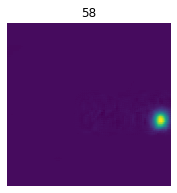

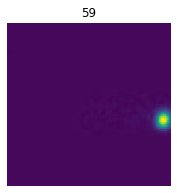

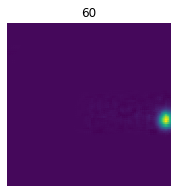

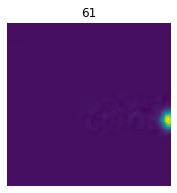

In [25]:
Nlandmark = y_test.shape[-1]
for i in range(10):#len(df)):
    fig = plt.figure(figsize=(3,3))
    ax = fig.add_subplot(1,1,1)
    ax.imshow(X_test[i,:,:,0],cmap="gray")
    ax.axis("off")
    plt.show()    
    count = 1
    for j in range(62):
    #for j in range(5):
        fig = plt.figure(figsize=(3, 3))
        ax = fig.add_subplot(1, 1, 1)
        ax.set_title(j)
        ax.axis("off")
        count += 1
        ax.imshow(y_test[i,:,:,j])
        plt.show()

In [26]:
def get_ave_xy(hmi, n_points = 4, thresh=0):
    '''
    hmi      : heatmap np array of size (height,width)
    n_points : x,y coordinates corresponding to the top  densities to calculate average (x,y) coordinates
    
    
    convert heatmap to (x,y) coordinate
    x,y coordinates corresponding to the top  densities 
    are used to calculate weighted average of (x,y) coordinates
    the weights are used using heatmap
    
    if the heatmap does not contain the probability > 
    then we assume there is no predicted landmark, and 
    x = -1 and y = -1 are recorded as predicted landmark.
    '''
    if n_points < 1:
        ## Use all
        hsum, n_points = np.sum(hmi), len(hmi.flatten())
        ind_hmi = np.array([range(input_width)]*input_height)
        i1 = np.sum(ind_hmi * hmi)/hsum
        ind_hmi = np.array([range(input_height)]*input_width).T
        i0 = np.sum(ind_hmi * hmi)/hsum
    else:
        ind = hmi.argsort(axis=None)[-n_points:] ## pick the largest n_points
        topind = np.unravel_index(ind, hmi.shape)
        index = np.unravel_index(hmi.argmax(), hmi.shape)
        i0, i1, hsum = 0, 0, 0
        for ind in zip(topind[0],topind[1]):
            h  = hmi[ind[0],ind[1]]
            hsum += h
            i0   += ind[0]*h
            i1   += ind[1]*h

        i0 /= hsum
        i1 /= hsum
    if hsum/n_points <= thresh:
        i0, i1 = -1, -1
    return([i1,i0])

def transfer_xy_coord(hm, n_points = 64, thresh=0.2):
    '''
    hm : np.array of shape (height,width, n-heatmap)
    
    transfer heatmap to (x,y) coordinates
    
    the output contains np.array (Nlandmark * 2,) 
    * 2 for x and y coordinates, containing the landmark location.
    '''
    assert len(hm.shape) == 3
    Nlandmark = hm.shape[-1]
    #est_xy = -1*np.ones(shape = (Nlandmark, 2))
    est_xy = []
    for i in range(Nlandmark):
        hmi = hm[:,:,i]
        est_xy.extend(get_ave_xy(hmi, n_points, thresh))
    return(est_xy) ## (Nlandmark * 2,) 

def transfer_target(y_pred, thresh=0, n_points = 64):
    '''
    y_pred : np.array of the shape (N, height, width, Nlandmark)
    
    output : (N, Nlandmark * 2)
    '''
    y_pred_xy = []
    for i in range(y_pred.shape[0]):
        hm = y_pred[i]
        y_pred_xy.append(transfer_xy_coord(hm,n_points, thresh))
    return(np.array(y_pred_xy))


In [28]:
#y_preds_xy = []
#for row in y_test:
#    y_pred_xy = transfer_target(row)
#    y_preds_xy.append(y_pred_xy)
#y_preds_xy = np.array(y_preds_xy)

y_preds_xy = transfer_target(y_test)

In [31]:
def plot_data(img, landmarks, axis):
    """
    Plot image (img), along with normalized facial keypoints (landmarks)
    """
    
    li = []
    for x in range(62):
        li.append(0 if(x > 30) else 100)
    
    axis.imshow(np.squeeze(img), cmap='gray') # plot the image
    #landmarks = landmarks * 160 + 160 # undo the normalization
    # Plot the keypoints
    axis.scatter(landmarks[0::2],
        landmarks[1::2],
        marker='o',
        #c='c',
        c=li,
        cmap="plasma",
        s=10)

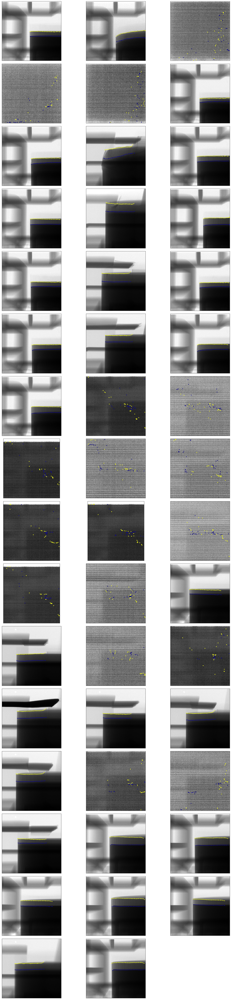

In [32]:
fig = plt.figure(figsize=(20,100))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)
for i in range(len(df)):
    ax = fig.add_subplot(20, 3, i + 1, xticks=[], yticks=[])
    plot_data(X_test[i], y_preds_xy[i], ax)

In [36]:
import glob
for imgfilepath in glob.glob("/images/new/*.tif"):
    im = get_image(imgfilepath)[0]
    X_arr = []
    X_arr.append(im)
    X_arr = NormalizeData(X_arr)
    X_arr = X_arr.astype(np.float32)
    X_arr = X_arr.reshape(-1,input_width,input_height,1)
    y_row = model.predict(X_arr)
    y_test = []
    y_test.append(y_row)
    y_test = np.array(y_test)
    y_test = y_test.reshape(-1,output_height,output_width,nClasses)
    y_test = transfer_target(y_test)
    fig = plt.figure(figsize=(20,100))
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)
    ax = fig.add_subplot(1, 1, 1, xticks=[], yticks=[])
    plot_data(X_arr[0], y_test[0], ax)
    fig.savefig('/images/plots/' + os.path.basename(imgfilepath) + '.jpg')   # save the figure to file
    plt.close(fig)    # close the figure window

In [37]:
hist = model.fit(train_generator, validation_data=valid_generator, validation_steps=VALIDATION_STEPS,
                     steps_per_epoch = 101, epochs = 50,verbose=True)

Epoch 1/50
101/101 [==============================] - 805s 8s/step - loss: 1.1922e-04 - val_loss: 9.3886e-05
Epoch 2/50
101/101 [==============================] - 805s 8s/step - loss: 1.3169e-04 - val_loss: 9.7240e-05
Epoch 3/50
101/101 [==============================] - 807s 8s/step - loss: 1.2522e-04 - val_loss: 7.9197e-05
Epoch 4/50
101/101 [==============================] - 805s 8s/step - loss: 1.3325e-04 - val_loss: 2.3712e-04
Epoch 5/50
101/101 [==============================] - 806s 8s/step - loss: 1.2114e-04 - val_loss: 1.0009e-04
Epoch 6/50
101/101 [==============================] - 801s 8s/step - loss: 1.1602e-04 - val_loss: 1.2436e-04
Epoch 7/50
101/101 [==============================] - 803s 8s/step - loss: 1.1155e-04 - val_loss: 6.6987e-05
Epoch 8/50
101/101 [==============================] - 804s 8s/step - loss: 1.2941e-04 - val_loss: 6.7306e-05
Epoch 9/50
101/101 [==============================] - 806s 8s/step - loss: 1.2026e-04 - val_loss: 4.3652e-05
Epoch 10/50
101/101

In [38]:
model.save('LM21_model2')

In [42]:
for imgfilepath in glob.glob("/images/new/*.tif"):
    im = get_image(imgfilepath)[0]
    X_arr = []
    X_arr.append(im)
    X_arr = NormalizeData(X_arr)
    X_arr = X_arr.astype(np.float32)
    X_arr = X_arr.reshape(-1,input_width,input_height,1)
    y_row = model.predict(X_arr)
    y_test = []
    y_test.append(y_row)
    y_test = np.array(y_test)
    y_test = y_test.reshape(-1,output_height,output_width,nClasses)
    y_test_xy = transfer_target(y_test)
    fig = plt.figure(figsize=(20,100))
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1, hspace=0.05, wspace=0.05)
    ax = fig.add_subplot(1, 1, 1, xticks=[], yticks=[])
    plot_data(X_arr[0], y_test_xy[0], ax)
    fig.savefig('/images/plots2/' + os.path.basename(imgfilepath) + '.jpg')   # save the figure to file
    plt.close(fig)    # close the figure window
    
    for j in range(62):
    #for j in range(5):
        fig = plt.figure(figsize=(3, 3))
        ax = fig.add_subplot(1, 1, 1)
        ax.set_title(j)
        ax.axis("off")
        ax.imshow(y_test[0,:,:,j])
        fig.savefig('/images/plots2/' + os.path.basename(imgfilepath) + '_' + str(j) + '.jpg')   # save the figure to file
        plt.close(fig)    # close the figure window
